In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()

In [2]:
last_march_df = pd.read_csv('E:/Project 5 credits/Final Project/2019march.csv',  sep='\t')
last_march_df.head()

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1111780073084903424,1111740294884548608,2019-03-30 05:29:59 Sri Lanka Standard Time,2019-03-30,05:29:59,530,984011637060526080,taffy_twt,№3⁷,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'tattedpoc', 'name': 'thugga ...",NaN,NaN,NaN,NaN
1,1111780073068261376,1111780073068261376,2019-03-30 05:29:59 Sri Lanka Standard Time,2019-03-30,05:29:59,530,1014582908479209472,ultyooa,❕moved,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2,1111780073059831808,1111780073059831808,2019-03-30 05:29:59 Sri Lanka Standard Time,2019-03-30,05:29:59,530,1023343509443686400,tpayne_25,Lamar,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,1111780072963403777,1111780072963403777,2019-03-30 05:29:59 Sri Lanka Standard Time,2019-03-30,05:29:59,530,348062590,mnn59,Manhattan Neighborhood Network,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,1111780072955015169,1111752182078947328,2019-03-30 05:29:59 Sri Lanka Standard Time,2019-03-30,05:29:59,530,2483203814,ilovelucywatso1,XBadBoyMambaX,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'xMissEris', 'name': 'Eris', ...",NaN,NaN,NaN,NaN


In [3]:
last_march_df.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77200 entries, 0 to 77199
Data columns (total 36 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               77200 non-null  int64  
 1   conversation_id  77200 non-null  int64  
 2   created_at       77200 non-null  object 
 3   date             77200 non-null  object 
 4   time             77200 non-null  object 
 5   timezone         77200 non-null  int64  
 6   user_id          77200 non-null  int64  
 7   username         77200 non-null  object 
 8   name             77190 non-null  object 
 9   place            395 non-null    object 
 10  tweet            77200 non-null  object 
 11  language         77200 non-null  object 
 12  mentions         77200 non-null  object 
 13  urls             77200 non-null  object 
 14  photos           77200 non-null  object 
 15  replies_count    77200 non-null  int64  
 16  retweets_count   77200 non-null  int64  
 17  likes_count 

In [4]:
last_march_df.dtypes

id                   int64
conversation_id      int64
created_at          object
date                object
time                object
timezone             int64
user_id              int64
username            object
name                object
place               object
tweet               object
language            object
mentions            object
urls                object
photos              object
replies_count        int64
retweets_count       int64
likes_count          int64
hashtags            object
cashtags            object
link                object
retweet               bool
quote_url           object
video                int64
thumbnail           object
near               float64
geo                float64
source             float64
user_rt_id         float64
user_rt            float64
retweet_id         float64
reply_to            object
retweet_date       float64
translate          float64
trans_src          float64
trans_dest         float64
dtype: object

<AxesSubplot:>

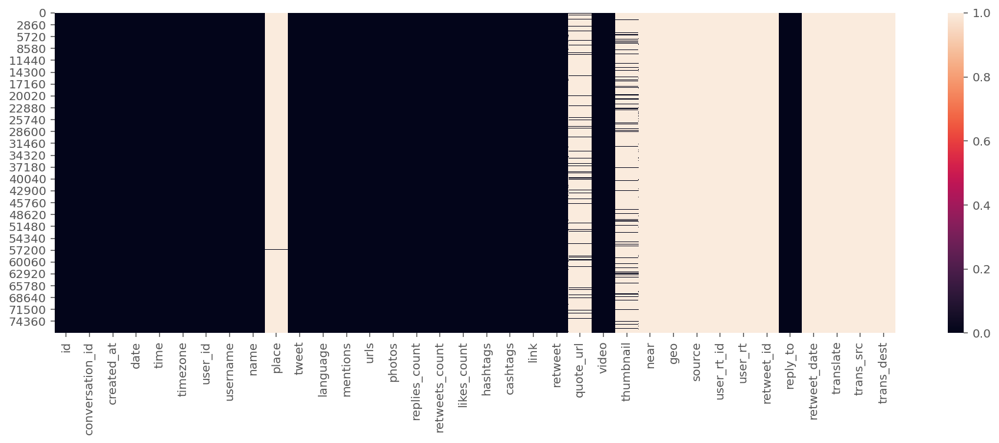

In [5]:
# check for null value in data
plt.figure(figsize = (16,5))
sns.heatmap(last_march_df.isnull())

In [6]:
import plotly.express as px

missed = pd.DataFrame()
missed['column'] = last_march_df.columns

missed['percent'] = [round(100* last_march_df[col].isnull().sum() / len(last_march_df), 2) for col in last_march_df.columns]
missed = missed.sort_values('percent')
missed = missed[missed['percent']>0]

fig = px.bar(
    missed, 
    x='percent', 
    y="column", 
    orientation='h', 
    title='Missed values percent for every column (percent > 0)', 
    height=400, 
    width=600
)

fig.show()

In [7]:
last_march_df.corr()

,id,conversation_id,timezone,user_id,replies_count,retweets_count,likes_count,retweet,video,near,geo,source,user_rt_id,user_rt,retweet_id,retweet_date,translate,trans_src,trans_dest
id,1.000000,-0.003459,NaN,0.000760,0.001471,0.002048,-0.004964,NaN,0.007019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
conversation_id,-0.003459,1.000000,NaN,-0.005721,-0.001841,0.001577,0.001519,NaN,0.008596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
timezone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
user_id,0.000760,-0.005721,NaN,1.000000,-0.007967,-0.007574,-0.008076,NaN,0.018771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
replies_count,0.001471,-0.001841,NaN,-0.007967,1.000000,0.179467,0.185240,NaN,0.011386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweets_count,0.002048,0.001577,NaN,-0.007574,0.179467,1.000000,0.810341,NaN,0.023879,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
likes_count,-0.004964,0.001519,NaN,-0.008076,0.185240,0.810341,1.000000,NaN,0.023272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
video,0.007019,0.008596,NaN,0.018771,0.011386,0.023879,0.023272,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
near,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0.5, 1.0, 'Correlation Heatmap')

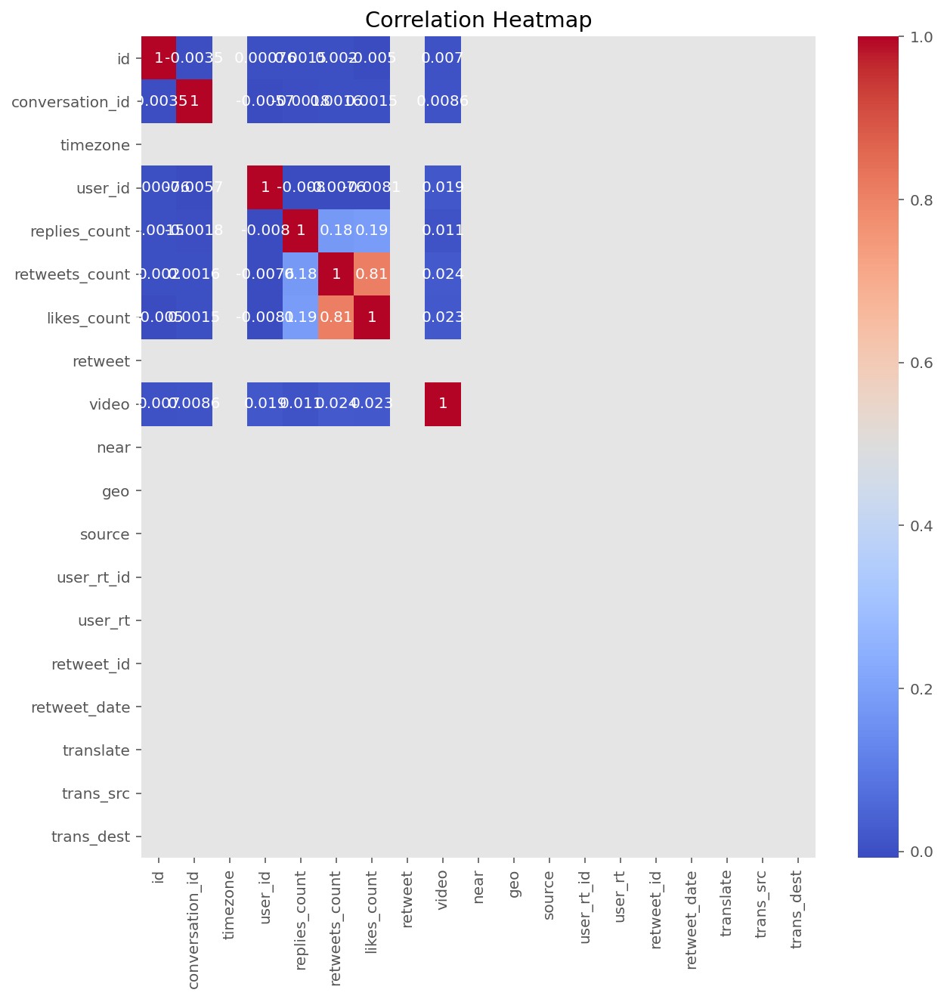

In [8]:
plt.figure(figsize=(10,10))
sns.heatmap(last_march_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap')

In [9]:
df_new = last_march_df['username'].value_counts().reset_index()
df_new.columns = ['username', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="username", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [10]:
df_new.tail(10)

,username,tweets_count
9,daniellapotengy,15
8,sprague_paul,15
7,monster,16
6,avl_beer_alert,17
5,douglasgauldya1,18
4,pinkyfaye,18
3,infinitesoleil,20
2,jfoxwoods,20
1,msamymacpherson,23
0,seabeeralert,24


In [11]:
last_march_df= pd.merge(last_march_df, df_new, on='username')

In [12]:
last_march_df.drop(['hashtags','cashtags','thumbnail','source','user_rt','retweet_id','reply_to','retweet_date','translate','trans_src','trans_dest', 'timezone', 'name', 'created_at', 'user_id', 'place', 'likes_count', 'link', 'retweet', 'quote_url', 'video', 'user_rt_id', 'near', 'geo', 'mentions', 'urls', 'photos', 'replies_count', 'retweets_count','conversation_id'], axis = 1, inplace = True)
last_march_df.drop_duplicates()
last_march_df.head()

,id,date,time,username,tweet,language,tweets_count
0,1111780073084903424,2019-03-30,05:29:59,taffy_twt,@tattedpoc @joonitoons The mansplaining in his...,en,1
1,1111780073068261376,2019-03-30,05:29:59,ultyooa,how does binnie make the “grown out roots” loo...,en,1
2,1111780073059831808,2019-03-30,05:29:59,tpayne_25,The melody in Riverside is played softly and q...,en,2
3,1111777366718730240,2019-03-30,05:19:14,tpayne_25,The tempo in Monday Night is pretty quick and ...,en,2
4,1111780072963403777,2019-03-30,05:29:59,mnn59,ON NOW: This week on The Carmen Mathis Show tu...,en,1


In [13]:
last_march_df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77200 entries, 0 to 77199
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            77200 non-null  int64 
 1   date          77200 non-null  object
 2   time          77200 non-null  object
 3   username      77200 non-null  object
 4   tweet         77200 non-null  object
 5   language      77200 non-null  object
 6   tweets_count  77200 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 4.7+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



<AxesSubplot:>

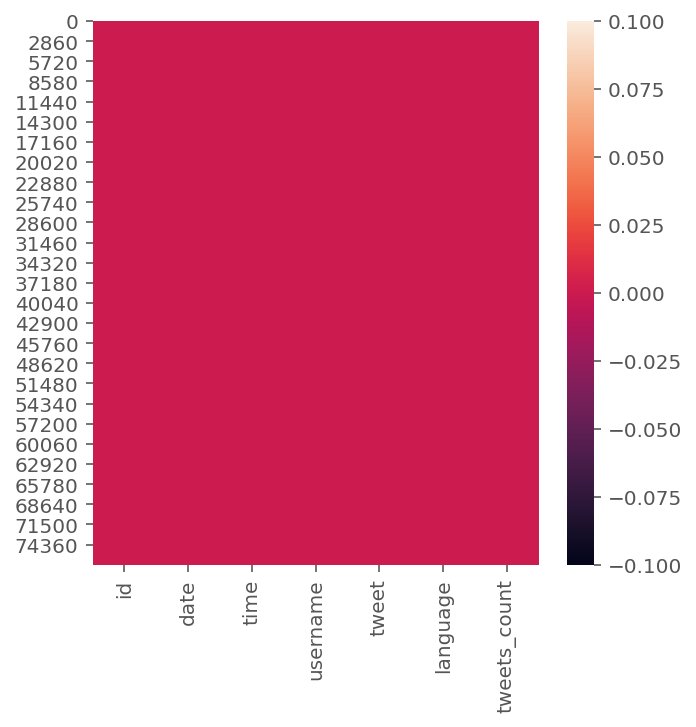

In [14]:
# check for null value in data
plt.figure(figsize = (5,5))
sns.heatmap(last_march_df.isnull())

Text(0.5, 1.0, 'Correlation Heatmap After Dropping Null Val')

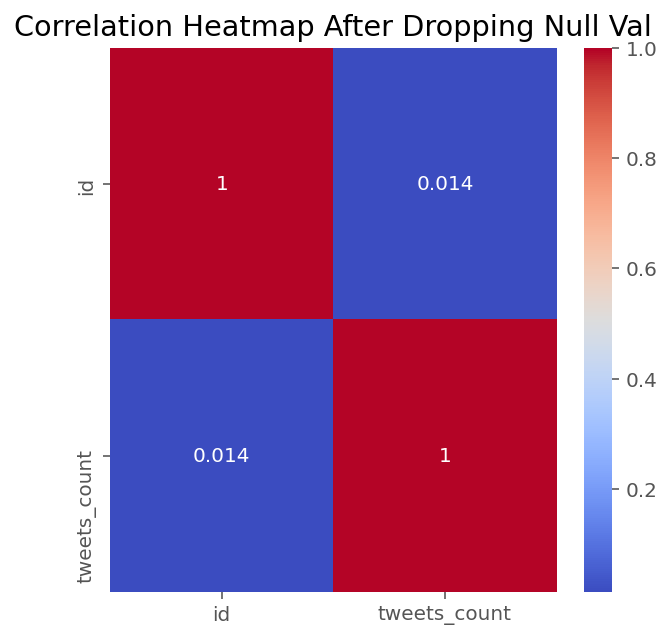

In [15]:
plt.figure(figsize=(5,5))
sns.heatmap(last_march_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap After Dropping Null Val')

In [16]:
df_english_only = last_march_df[last_march_df['language'] == 'en']
df_english_only.head()

,id,date,time,username,tweet,language,tweets_count
0,1111780073084903424,2019-03-30,05:29:59,taffy_twt,@tattedpoc @joonitoons The mansplaining in his...,en,1
1,1111780073068261376,2019-03-30,05:29:59,ultyooa,how does binnie make the “grown out roots” loo...,en,1
2,1111780073059831808,2019-03-30,05:29:59,tpayne_25,The melody in Riverside is played softly and q...,en,2
3,1111777366718730240,2019-03-30,05:19:14,tpayne_25,The tempo in Monday Night is pretty quick and ...,en,2
4,1111780072963403777,2019-03-30,05:29:59,mnn59,ON NOW: This week on The Carmen Mathis Show tu...,en,1


In [17]:
last_march_df_reindex = pd.concat([df_english_only], ignore_index=True)

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
df_new = last_march_df_reindex[last_march_df_reindex['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                        id        date      time         username  \
0      1111780073084903424  2019-03-30  05:29:59        taffy_twt   
1      1111780073068261376  2019-03-30  05:29:59          ultyooa   
2      1111780073059831808  2019-03-30  05:29:59        tpayne_25   
3      1111777366718730240  2019-03-30  05:19:14        tpayne_25   
4      1111780072963403777  2019-03-30  05:29:59            mnn59   
...                    ...         ...       ...              ...   
75534  1111776619650273280  2019-03-30  05:16:16         todkapuz   
75535  1111776619633565696  2019-03-30  05:16:16  sweetsmokscreen   
75536  1111776619331493889  2019-03-30  05:16:16     retiredman01   
75537  1111776619105009671  2019-03-30  05:16:16     robbiehowell   
75538  1111776618974978048  2019-03-30  05:16:16    peter26123401   

                                                   tweet language  \
0      @tattedpoc @joonitoons The mansplaining in his...       en   
1      how does binnie make the “

In [20]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [21]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1111780073084903424,2019-03-30,05:29:59,taffy_twt,@tattedpoc @joonitoons The mansplaining in his...,en,1,tattedpoc joonitoons the mansplaining tweets real,Neutral
1,1111780073068261376,2019-03-30,05:29:59,ultyooa,how does binnie make the “grown out roots” loo...,en,1,binnie make grown roots look work well,Positive
2,1111780073059831808,2019-03-30,05:29:59,tpayne_25,The melody in Riverside is played softly and q...,en,2,the melody riverside played softly quietly mus,Positive
3,1111777366718730240,2019-03-30,05:19:14,tpayne_25,The tempo in Monday Night is pretty quick and ...,en,2,the tempo monday night pretty quick fast mus,Positive
4,1111780072963403777,2019-03-30,05:29:59,mnn59,ON NOW: This week on The Carmen Mathis Show tu...,en,1,on now this week the carmen mathis show tune i...,Neutral


(-0.5, 399.5, 199.5, -0.5)

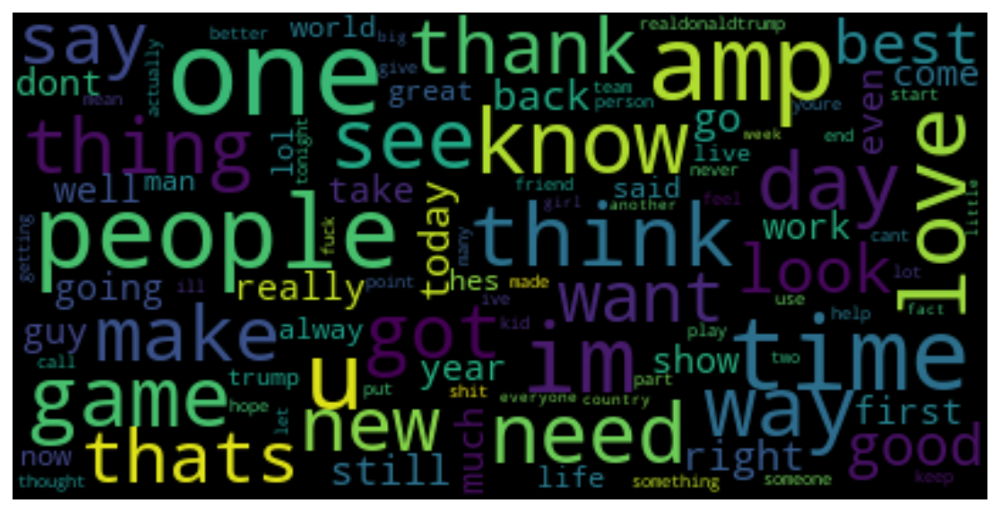

In [22]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [23]:
df_new['text']

0        tattedpoc joonitoons the mansplaining tweets real
1                   binnie make grown roots look work well
2           the melody riverside played softly quietly mus
3             the tempo monday night pretty quick fast mus
4        on now this week the carmen mathis show tune i...
                               ...                        
75534    the sun setting miami nicky romero taken main ...
75535                    white people big narsty show like
75536    sweetkat mikandynothem dsanchez purpleiscovfef...
75537    is one republic way considered cool this track...
75538    tms abysmal wa capitulation dead its resting i...
Name: text, Length: 75539, dtype: object

In [24]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,36868
0,Negative,20166
1,Neutral,18505


<AxesSubplot:xlabel='sentiment', ylabel='count'>

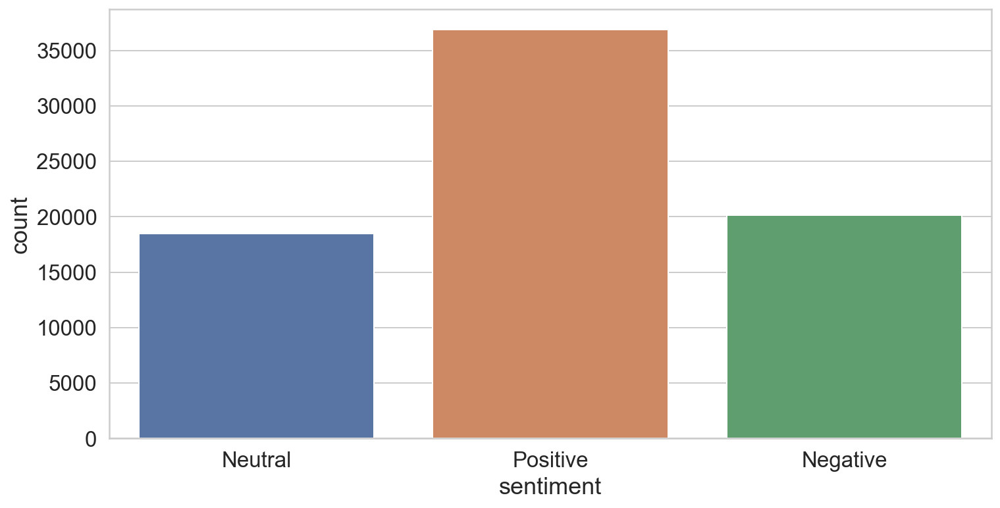

In [25]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [26]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

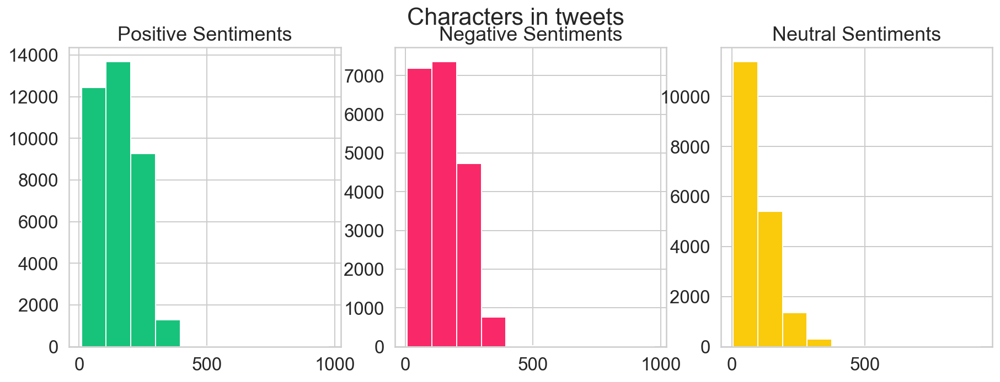

In [27]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

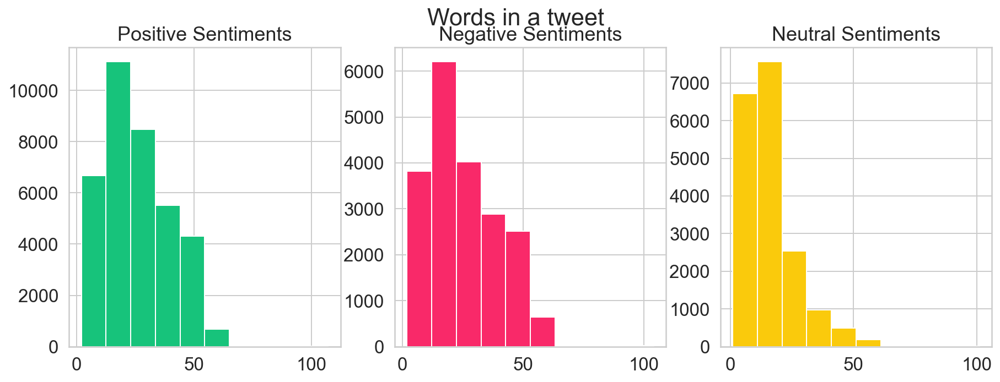

In [28]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()


Text(0.5, 0.98, 'Average word length in each tweet')

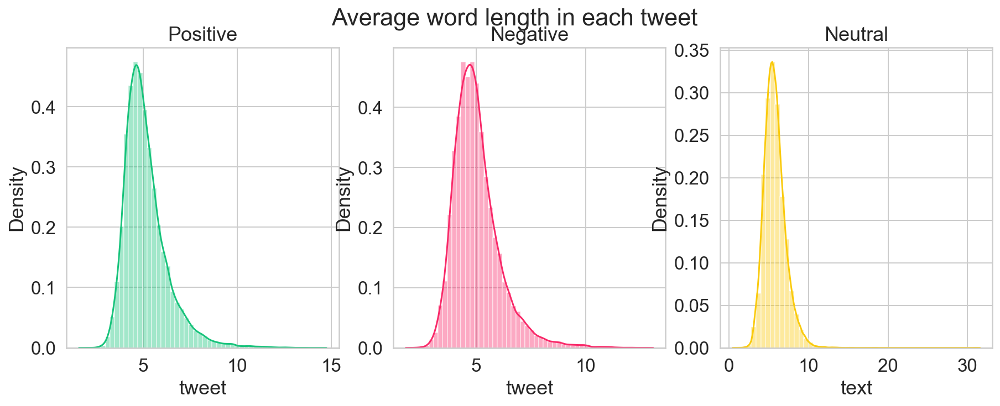

In [29]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [30]:
def create_corpus(target):
    corpus=[]
    
    for x in df_new[df_new['sentiment']==target ]['text'].str.split():
        for i in x:
            corpus.append(i)
    return corpus

In [31]:
np.array(stopwords)

array({"hadn't", 'mustn', 'of', 'do', "it's", 'that', 'from', 'through', 'which', 'y', 'all', 'but', "mustn't", "hasn't", 'most', 'this', 'where', 'couldn', 'they', 'isn', 'i', 'both', 'not', 'yourself', 'his', 'here', 'haven', 'needn', 'during', 'm', 'is', 'on', 'up', 'the', 'shouldn', 'with', 'after', 'be', 'd', "shan't", 'again', 'being', 'was', 'me', 'by', 'down', 'very', 'at', 'o', 'against', 'because', 'few', "wasn't", 'themselves', 'll', 'further', 'myself', "couldn't", "weren't", 'have', "she's", "haven't", 'yours', 'its', 'whom', 'or', 'our', 'mightn', 'than', "that'll", 're', 'before', 'once', 'can', 'she', 'too', 'as', "doesn't", 'had', 'under', 'own', 've', "wouldn't", 'what', 'then', 'in', 'between', 'nor', 'such', 'itself', 'won', 'just', 'now', 'shan', 'those', 'no', 'am', 'did', 'there', "you'd", 'off', 'any', 'ourselves', "aren't", 's', 'wouldn', 'her', 'yourselves', 't', 'wasn', 'himself', 'until', "mightn't", 'hers', 'their', 'when', 'will', 'we', 'out', "isn't", 'a'

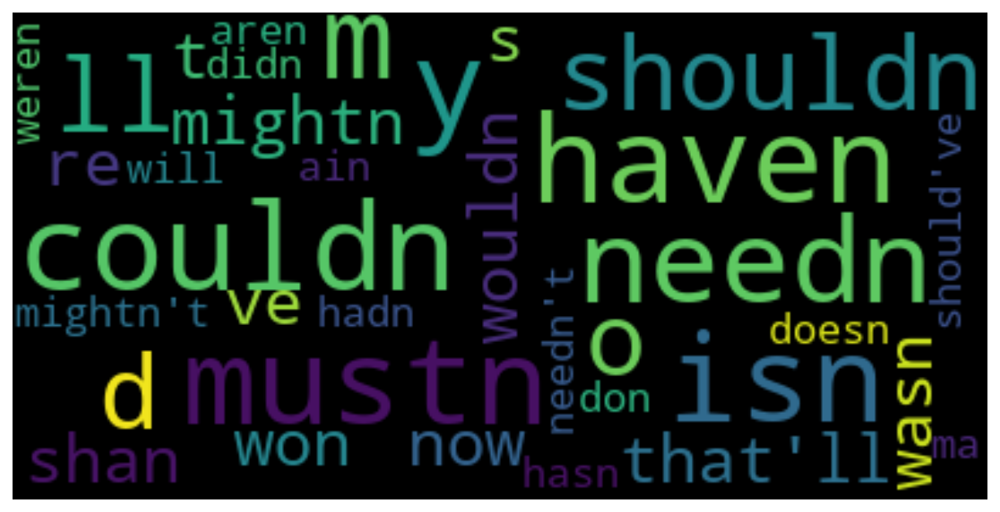

In [32]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 


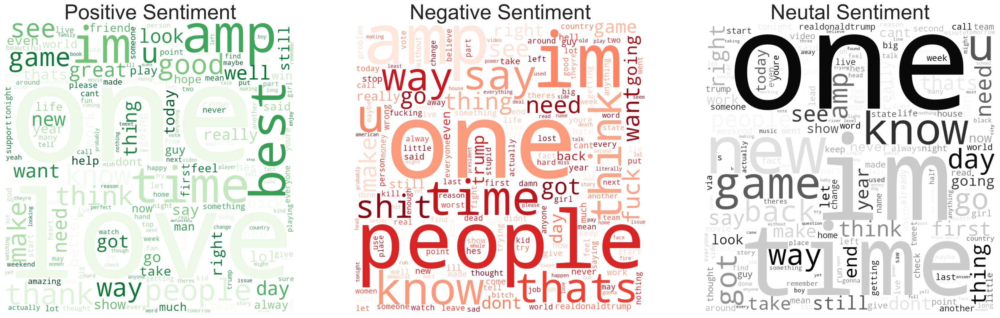

In [33]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [34]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

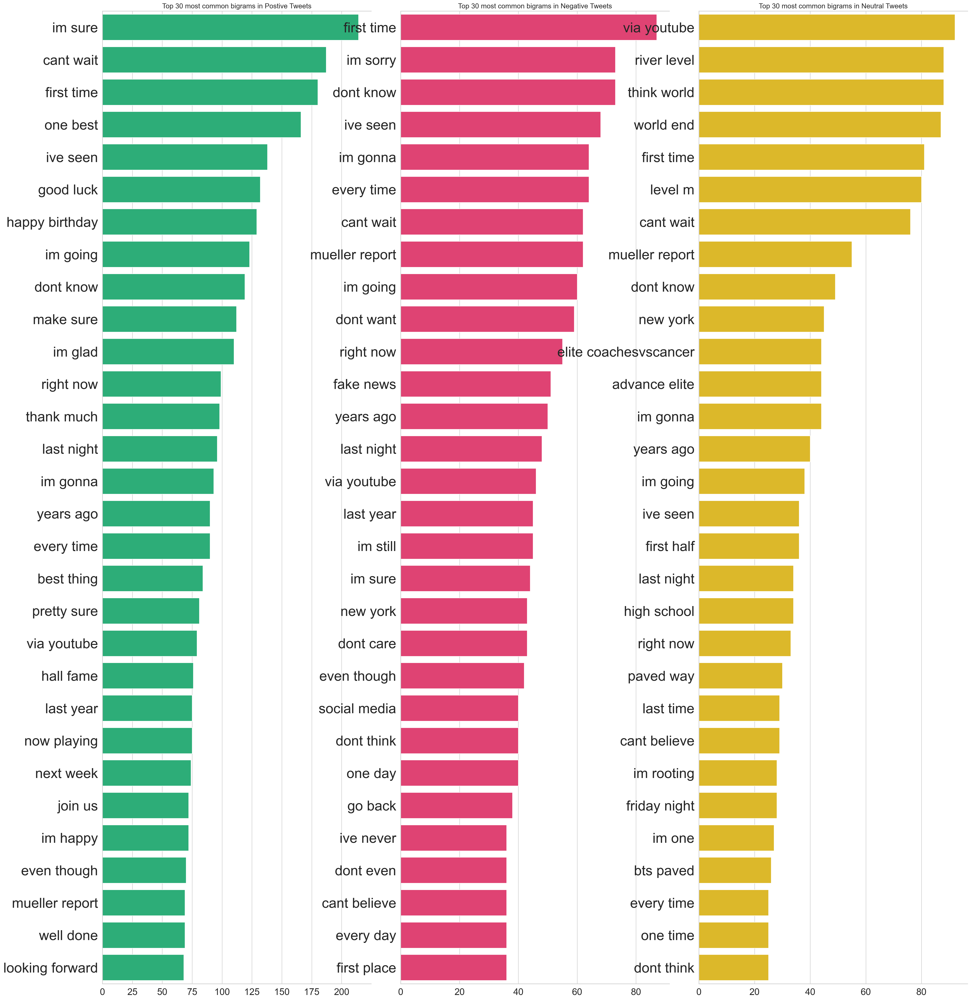

In [35]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

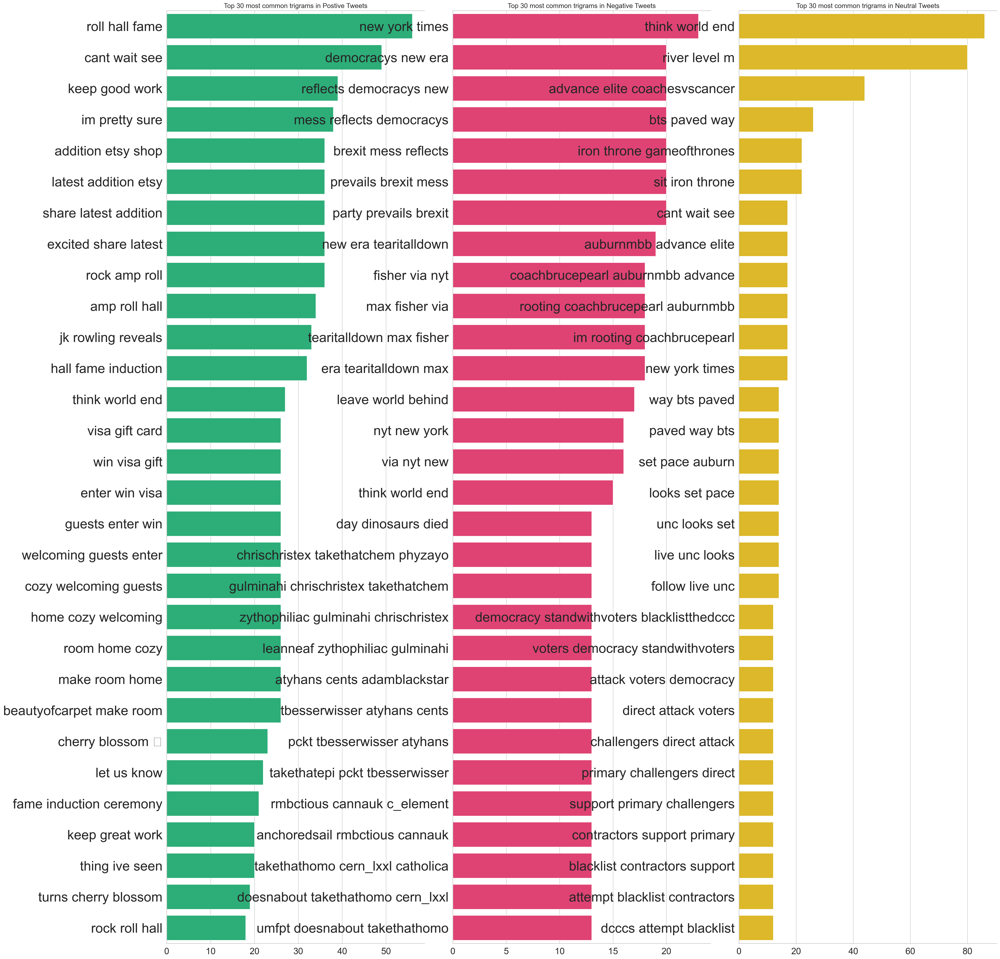

In [36]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [37]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1111780073084903424,2019-03-30,05:29:59,taffy_twt,@tattedpoc @joonitoons The mansplaining in his...,en,1,tattedpoc joonitoons the mansplaining tweets real,Neutral
1,1111780073068261376,2019-03-30,05:29:59,ultyooa,how does binnie make the “grown out roots” loo...,en,1,binnie make grown roots look work well,Positive
2,1111780073059831808,2019-03-30,05:29:59,tpayne_25,The melody in Riverside is played softly and q...,en,2,the melody riverside played softly quietly mus,Positive
3,1111777366718730240,2019-03-30,05:19:14,tpayne_25,The tempo in Monday Night is pretty quick and ...,en,2,the tempo monday night pretty quick fast mus,Positive
4,1111780072963403777,2019-03-30,05:29:59,mnn59,ON NOW: This week on The Carmen Mathis Show tu...,en,1,on now this week the carmen mathis show tune i...,Neutral


In [38]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [39]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1111778135777964032,2019-03-30,05:22:18,danielmcfadin,Bowman got sideways in Turn 2 and smacked the ...,en,3,bowman got sideways turn smacked wall,Neutral
1,1111778003246288896,2019-03-30,05:21:46,thatandrecamara,@DavidSoulsby11 @JuliaHB1 There were over 1 Mi...,en,4,davidsoulsby juliahb there million march you s...,Positive
2,1111779934245216262,2019-03-30,05:29:26,angela214,@realDonaldTrump As far as I’m concerned it’s ...,en,1,realdonaldtrump as far im concerned its overke...,Positive
3,1111777624290779136,2019-03-30,05:20:16,danny_delaware,for every thing flume did that I enjoyed on Hi...,en,1,every thing flume i enjoyed hi this is flume f...,Positive
4,1111778836071571456,2019-03-30,05:25:05,crackkkhead,@JoezMcfLy @YouTube Go live on the Yes network,en,1,joezmcfly youtube go live yes network,Positive


In [40]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,36628
0,Negative,20091
1,Neutral,18412


<AxesSubplot:xlabel='sentiment', ylabel='count'>

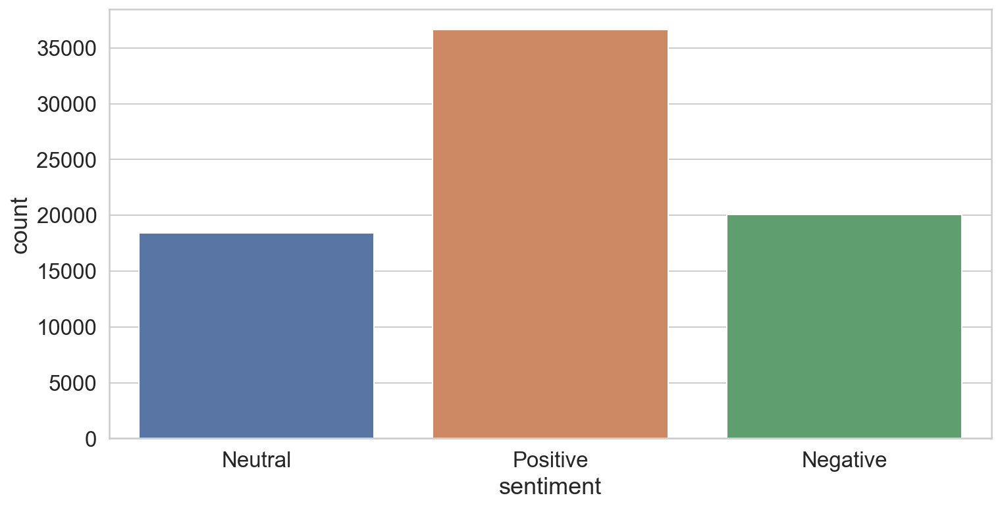

In [41]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [42]:
print(df_new)

                        id        date      time         username  \
0      1111778135777964032  2019-03-30  05:22:18    danielmcfadin   
1      1111778003246288896  2019-03-30  05:21:46  thatandrecamara   
2      1111779934245216262  2019-03-30  05:29:26        angela214   
3      1111777624290779136  2019-03-30  05:20:16   danny_delaware   
4      1111778836071571456  2019-03-30  05:25:05      crackkkhead   
...                    ...         ...       ...              ...   
75126  1111776686008401921  2019-03-30  05:16:32          dkazuti   
75127  1111777794722156544  2019-03-30  05:20:56       mskoyaness   
75128  1111779062949675008  2019-03-30  05:25:59     dianamargala   
75129  1111778735978622976  2019-03-30  05:24:41       mikehaukom   
75130  1111778919181623297  2019-03-30  05:25:24         lewisdpi   

                                                   tweet language  \
0      Bowman got sideways in Turn 2 and smacked the ...       en   
1      @DavidSoulsby11 @JuliaHB1 

In [43]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [44]:
len(df_new_final)

40000

In [45]:
export_csv = df_new_final.to_csv(r'2019 tweets.csv')